# OpenCV

## Loading the image

In [ ]:
import cv2

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
image = cv2.imread('/content/drive/MyDrive/Computer Vision Masterclass/Images/people1.jpg')

In [ ]:
image.shape

(1280, 1920, 3)

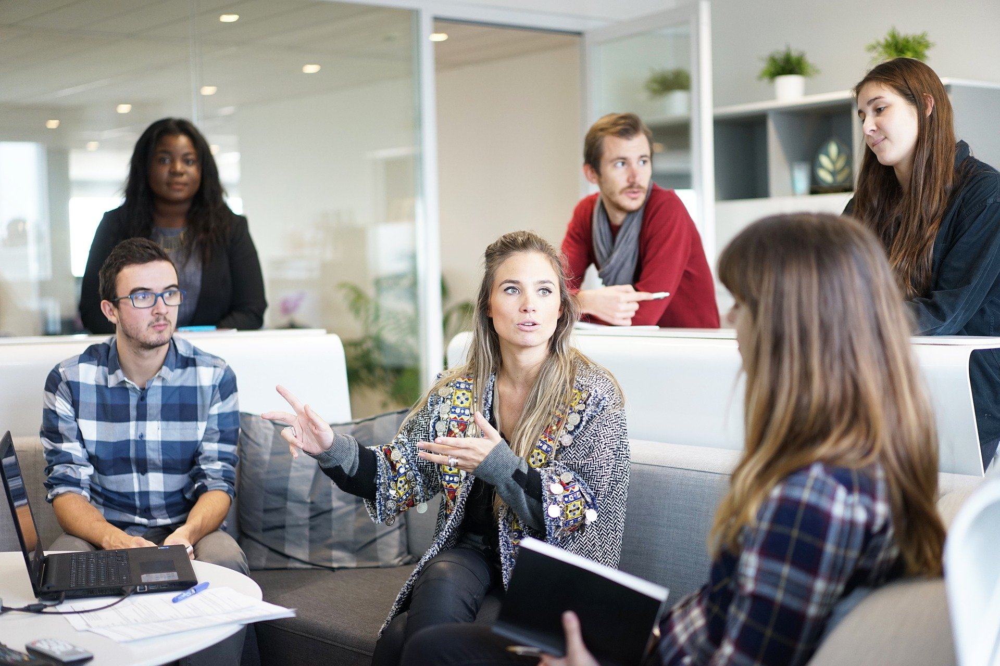

In [ ]:
from google.colab.patches import cv2_imshow
cv2_imshow(image)

In [ ]:
resized_image = cv2.resize(image, (800,600))
resized_image.shape

(600, 800, 3)

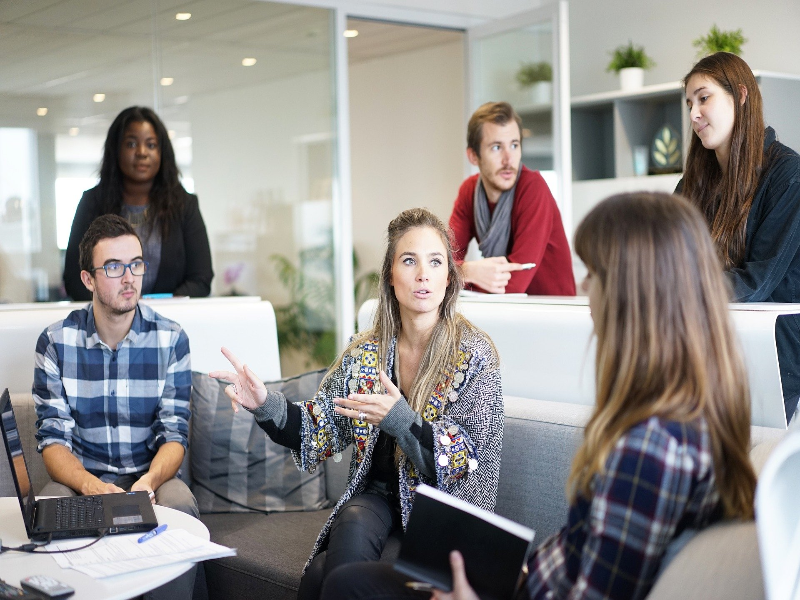

In [ ]:
cv2_imshow(resized_image)

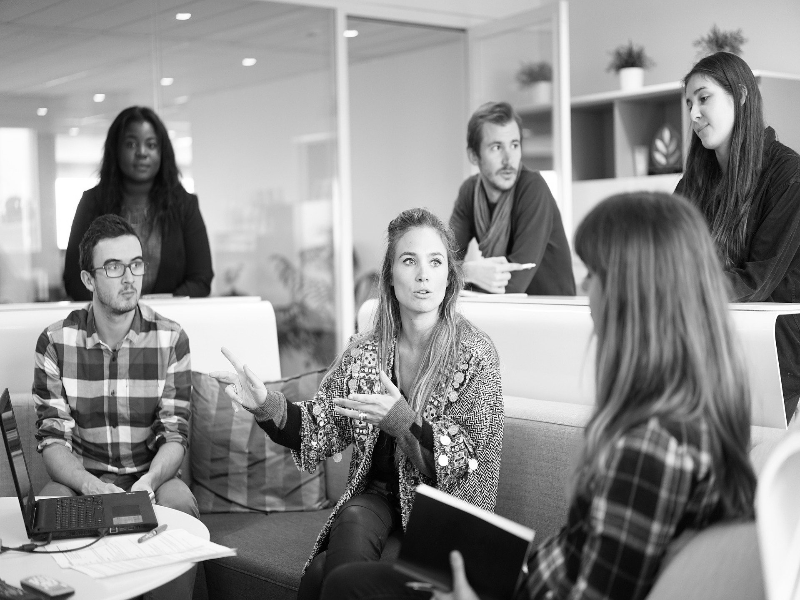

In [ ]:
image_gray = cv2.cvtColor(resized_image, cv2.COLOR_BGR2GRAY)
cv2_imshow(image_gray)

In [ ]:
image_gray.shape

(600, 800)

## Detecting faces

In [ ]:
face_detector = cv2.CascadeClassifier('/content/drive/MyDrive/Computer Vision Masterclass/Cascades/haarcascade_frontalface_default.xml')

In [ ]:
detections = face_detector.detectMultiScale(image_gray)

In [ ]:
detections

array([[677,  72,  68,  68],
       [115, 124,  53,  53],
       [475, 123,  59,  59],
       [387, 233,  73,  73],
       [ 92, 239,  66,  66],
       [390, 323,  56,  56]], dtype=int32)

In [ ]:
len(detections)

6

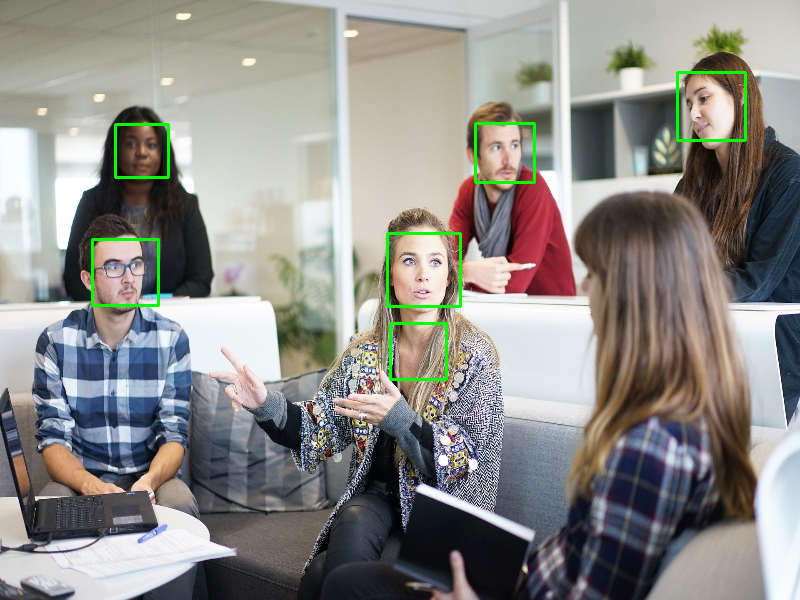

In [ ]:
for (x, y, w, h) in detections:
  cv2.rectangle(resized_image, (x, y), (x + w, y + h), (0, 255, 0), 2)
cv2_imshow(resized_image)

## Haarcascade parameters

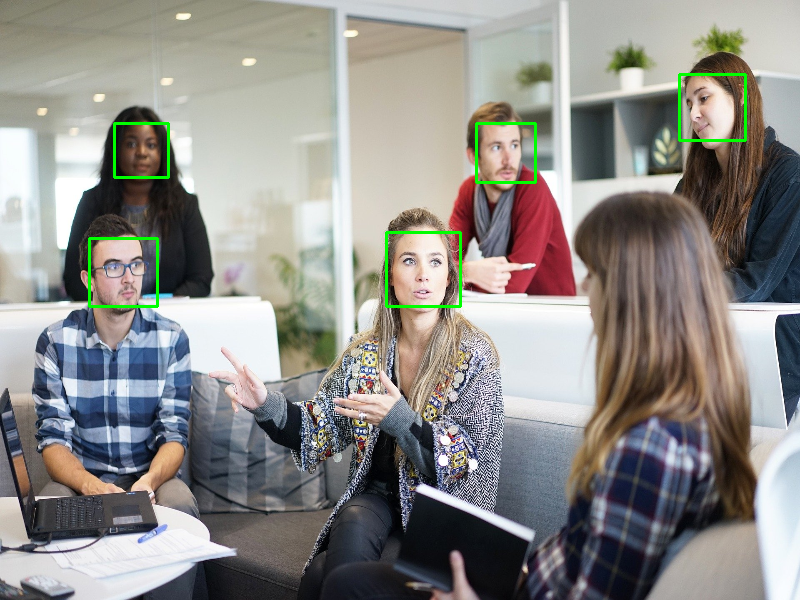

In [ ]:
detections_sf = face_detector.detectMultiScale(image_gray, scaleFactor=1.08)
resized_image = cv2.resize(image, (800,600))
resized_image.shape
for (x, y, w, h) in detections_sf:
  cv2.rectangle(resized_image, (x, y), (x + w, y + h), (0, 255, 0), 2)
cv2_imshow(resized_image)

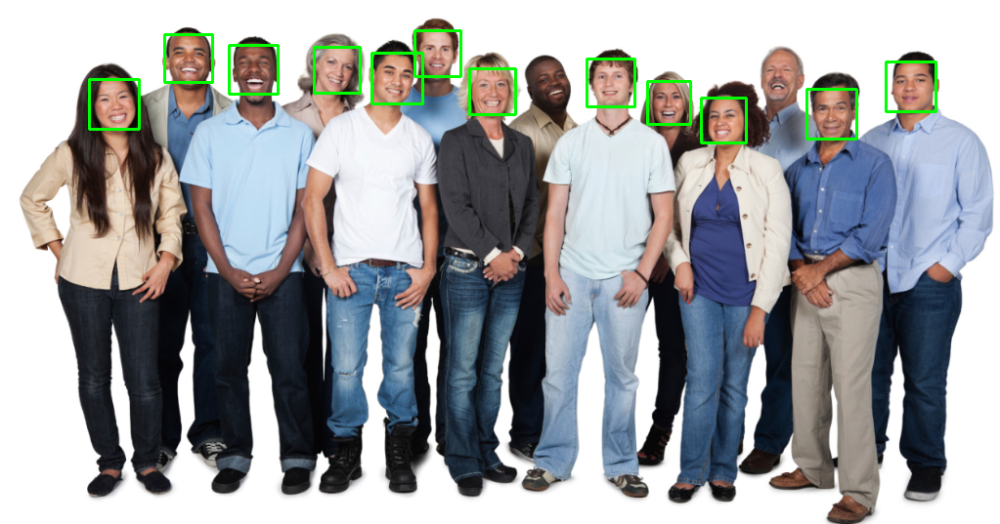

In [ ]:
image2 = cv2.imread('/content/drive/MyDrive/Computer Vision Masterclass/Images/people2.jpg')
image_gray2 = cv2.cvtColor(image2, cv2.COLOR_BGR2GRAY)
detections_mn = face_detector.detectMultiScale(image_gray2, scaleFactor=1.2, minNeighbors=7)
for (x, y, w, h) in detections_mn:
  cv2.rectangle(image2, (x, y), (x + w, y + h), (0, 255, 0), 2)
cv2_imshow(image2)

## Eye detection

In [ ]:
eye_detector = cv2.CascadeClassifier('/content/drive/MyDrive/Computer Vision Masterclass/Cascades/haarcascade_eye.xml')

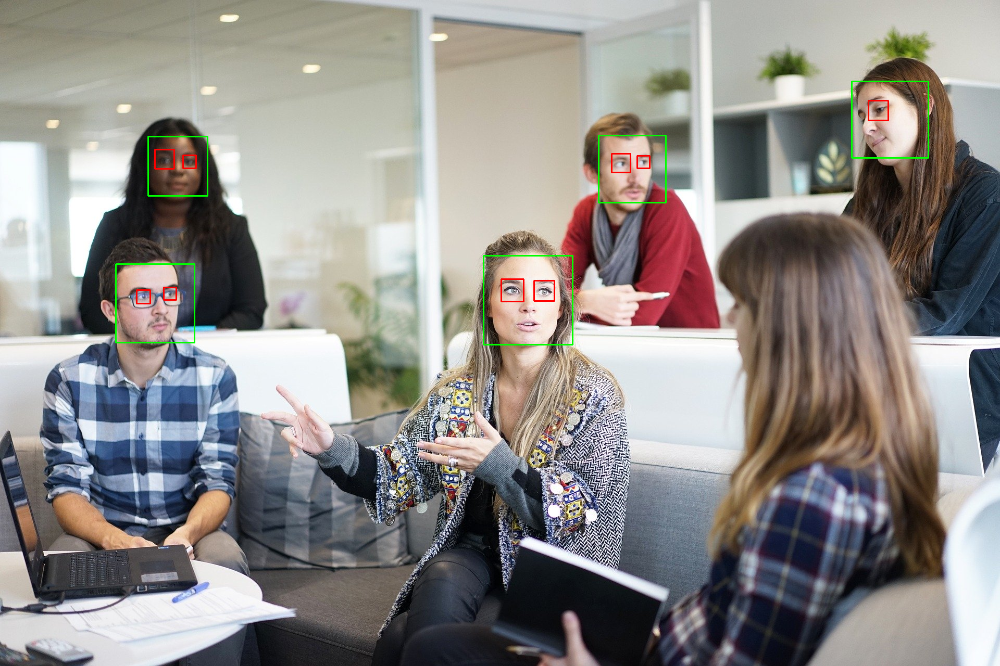

In [ ]:
image_eye = cv2.imread('/content/drive/MyDrive/Computer Vision Masterclass/Images/people1.jpg')
#image_eye_resized = cv2.resize(image_eye, (800, 600))
image_eye_gray = cv2.cvtColor(image_eye, cv2.COLOR_BGR2GRAY)

face_detections = face_detector.detectMultiScale(image_eye_gray, scaleFactor=1.3, minSize=(30,30))
for (x, y, w, h) in face_detections:
  cv2.rectangle(image_eye, (x, y), (x + w, y + h), (0, 255, 0), 2)

eye_detections = eye_detector.detectMultiScale(image_eye_gray, scaleFactor=1.1, minNeighbors=10, maxSize=(70, 70))
for (x, y, w, h) in eye_detections:
  cv2.rectangle(image_eye, (x, y), (x + w, y + h), (0, 0, 255), 2)

cv2_imshow(image_eye)

## Other objects

### Cars

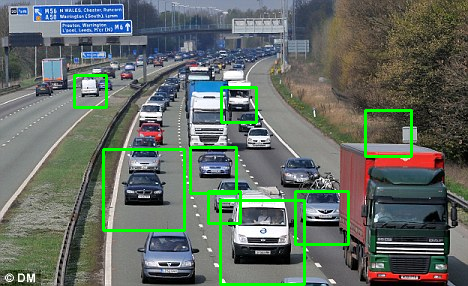

In [ ]:
car_detector = cv2.CascadeClassifier('/content/drive/MyDrive/Computer Vision Masterclass/Cascades/cars.xml')
image_car = cv2.imread('/content/drive/MyDrive/Computer Vision Masterclass/Images/car.jpg')
car_gray = cv2.cvtColor(image_car, cv2.COLOR_BGR2GRAY)

detections = car_detector.detectMultiScale(car_gray, scaleFactor=1.03, minNeighbors=5)
for (x, y, w, h) in detections:
  cv2.rectangle(image_car, (x, y), (x + w, y + h), (0, 255, 0), 2)
cv2_imshow(image_car)

### Clocks

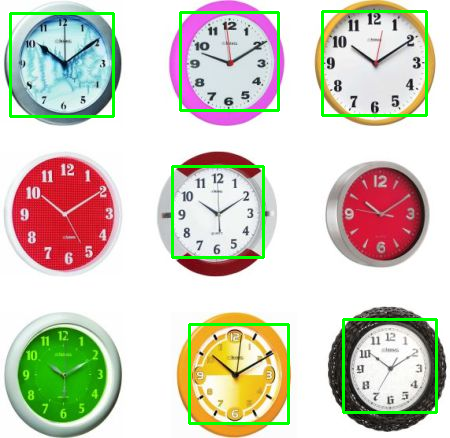

In [ ]:
clock_detector = cv2.CascadeClassifier('/content/drive/MyDrive/Computer Vision Masterclass/Cascades/clocks.xml')
image_clock = cv2.imread('/content/drive/MyDrive/Computer Vision Masterclass/Images/clock.jpg')
clock_gray = cv2.cvtColor(image_clock, cv2.COLOR_BGR2GRAY)

detections = clock_detector.detectMultiScale(clock_gray, scaleFactor=1.03, minNeighbors=5)
for (x, y, w, h) in detections:
  cv2.rectangle(image_clock, (x, y), (x + w, y + h), (0, 255, 0), 2)
cv2_imshow(image_clock)

### Full body

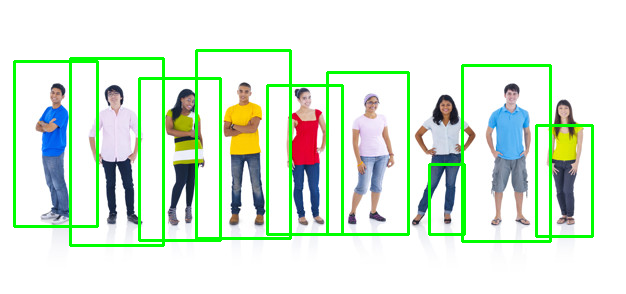

In [ ]:
fullbody_detector = cv2.CascadeClassifier('/content/drive/MyDrive/Computer Vision Masterclass/Cascades/fullbody.xml')
image_fullbody = cv2.imread('/content/drive/MyDrive/Computer Vision Masterclass/Images/people3.jpg')
fullbody_gray = cv2.cvtColor(image_fullbody, cv2.COLOR_BGR2GRAY)

detections = fullbody_detector.detectMultiScale(fullbody_gray, scaleFactor=1.05, minNeighbors=5)
for (x, y, w, h) in detections:
  cv2.rectangle(image_fullbody, (x, y), (x + w, y + h), (0, 255, 0), 2)
cv2_imshow(image_fullbody)

# Dlib

In [ ]:
import dlib

## Detecting faces with HOG

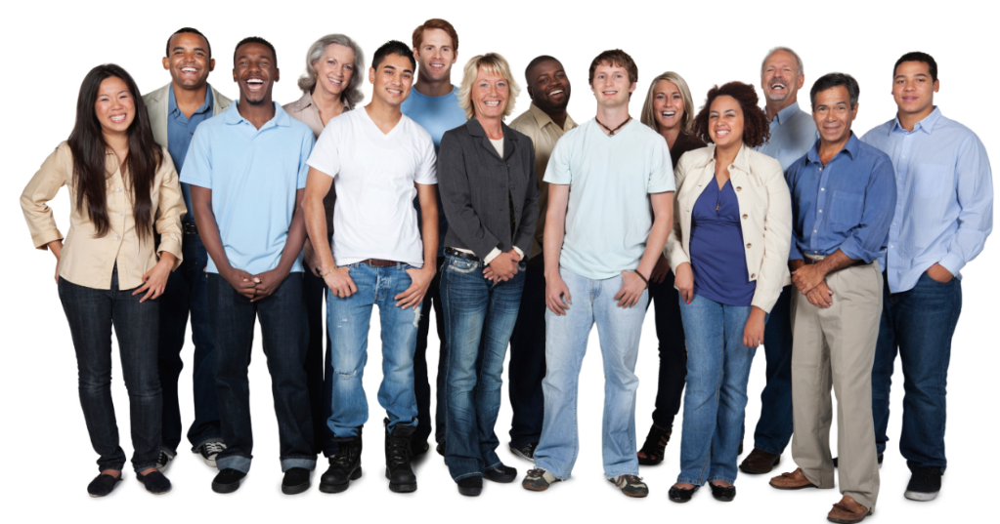

In [ ]:
image_hog = cv2.imread('/content/drive/MyDrive/Computer Vision Masterclass/Images/people2.jpg')
cv2_imshow(image_hog)

In [ ]:
face_detector_hog = dlib.get_frontal_face_detector()

In [ ]:
detections_hog = face_detector_hog(image_hog, 1)

In [ ]:
detections_hog, len(detections_hog)

(rectangles[[(429, 38) (465, 74)], [(665, 90) (701, 126)], [(717, 103) (760, 146)], [(909, 70) (952, 113)], [(828, 98) (871, 142)], [(605, 70) (641, 106)], [(777, 62) (813, 98)], [(485, 78) (521, 114)], [(386, 60) (429, 103)], [(170, 41) (213, 84)], [(93, 89) (136, 132)], [(237, 50) (280, 94)], [(323, 50) (367, 94)], [(544, 65) (588, 108)]],
 14)

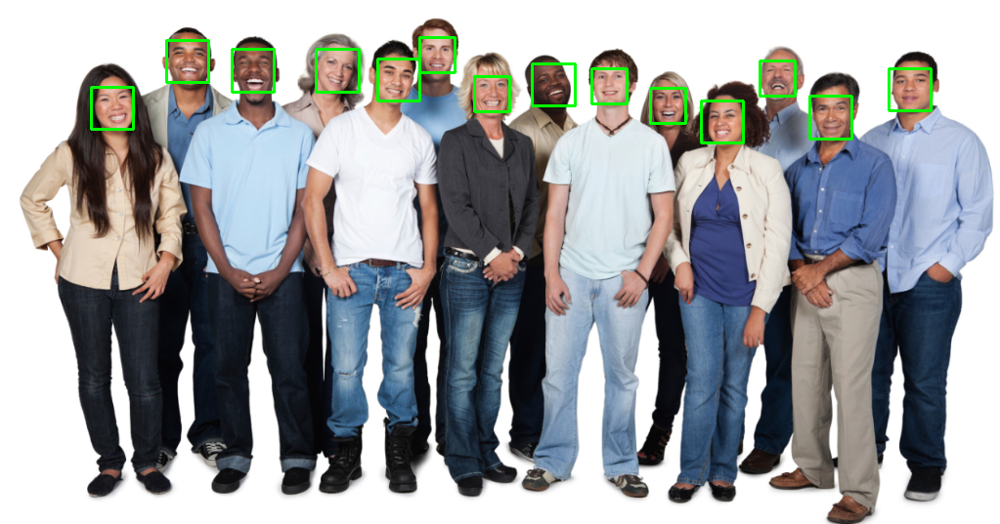

In [ ]:
for face in detections_hog:
  l, t, r, b = face.left(), face.top(), face.right(), face.bottom()
  cv2.rectangle(image_hog, (l, t), (r, b), (0, 255, 0), 2)
cv2_imshow(image_hog)

## Detecting faces with CNN

In [ ]:
image_cnn = cv2.imread('/content/drive/MyDrive/Computer Vision Masterclass/Images/people2.jpg')
cnn_detector = dlib.cnn_face_detection_model_v1('/content/drive/MyDrive/Computer Vision Masterclass/Weights/mmod_human_face_detector.dat')

1.1440608501434326
1.1370506286621094
1.127898931503296
1.1200274229049683
1.1149379014968872
1.1131560802459717
1.0975687503814697
1.0942119359970093
1.0853146314620972
1.0801897048950195
1.0800751447677612
1.0784766674041748
1.0664023160934448
1.06417977809906


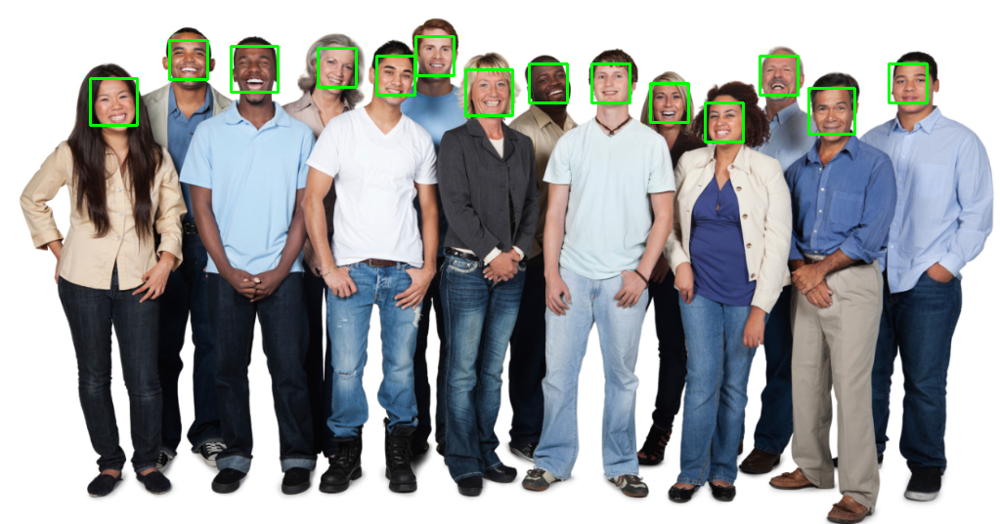

In [ ]:
detections_cnn = cnn_detector(image_cnn, 1)
for face in detections_cnn:
  l, t, r, b, c = face.rect.left(), face.rect.top(), face.rect.right(), face.rect.bottom(), face.confidence
  print(c)
  cv2.rectangle(image_cnn, (l, t), (r, b), (0, 255, 0), 2)
cv2_imshow(image_cnn)

## Haarcascade x HOG x CNN

In [ ]:
image_cmp = cv2.imread('/content/drive/MyDrive/Computer Vision Masterclass/Images/people3.jpg')
image_cmp_gray = cv2.cvtColor(image_cmp, cv2.COLOR_BGR2GRAY)

### Haarcascade

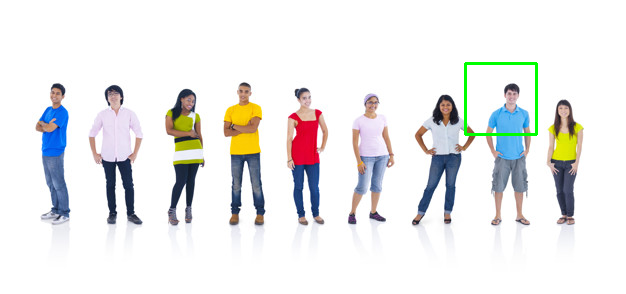

In [ ]:
image_haar = image_cmp.copy()
haarcascade_detector = cv2.CascadeClassifier('/content/drive/MyDrive/Computer Vision Masterclass/Cascades/haarcascade_frontalface_default.xml')
detections_haar = haarcascade_detector.detectMultiScale(image_cmp_gray, scaleFactor=1.001, minNeighbors=5, minSize=(5,5))
for (x, y, w, h) in detections_haar:
  cv2.rectangle(image_haar, (x, y), (x + w, y + h), (0, 255, 0), 2)
cv2_imshow(image_haar)

### HOG

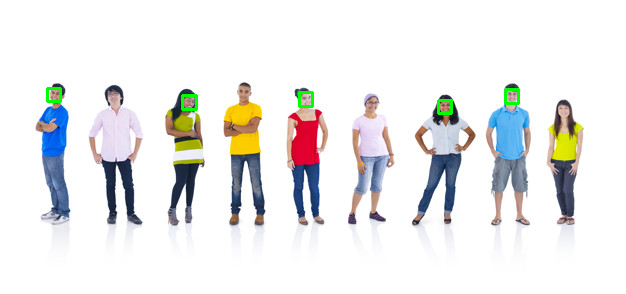

In [ ]:
image_hog = image_cmp.copy()
hog_detector = dlib.get_frontal_face_detector()
detections_hog = hog_detector(image_hog, 4)
for face in detections_hog:
  l, t, r, b = face.left(), face.top(), face.right(), face.bottom()
  cv2.rectangle(image_hog, (l, t), (r, b), (0, 255, 0), 2)
cv2_imshow(image_hog)

### CNN

0.44638633728027344
0.08115899562835693


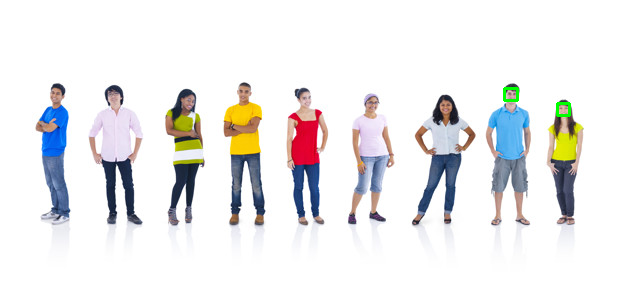

In [ ]:
image_cnn = image_cmp.copy()
cnn_detector = dlib.cnn_face_detection_model_v1('/content/drive/MyDrive/Computer Vision Masterclass/Weights/mmod_human_face_detector.dat')
detections_cnn = cnn_detector(image_cnn, 4)
for face in detections_cnn:
  l, t, r, b, c = face.rect.left(), face.rect.top(), face.rect.right(), face.rect.bottom(), face.confidence
  print(c)
  cv2.rectangle(image_cnn, (l, t), (r, b), (0, 255, 0), 2)
cv2_imshow(image_cnn)